In [7]:
from datasets import load_dataset
import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [8]:
# Set random seed for reproducibility
torch.manual_seed(42)


image_train_dataset = load_dataset(
'keremberke/satellite-building-segmentation',
split='train', name='full'
).to_pandas()
image_train_dataset.head()
test_set = image_train_dataset[101:121]
image_train_dataset = image_train_dataset[:100]
print(len(image_train_dataset))
for e in test_set:
    for x in e:
        print(test_set[e])
        print(x)

100
101    5260
102    2210
103    2445
104    1083
105    3093
106      11
107     386
108    5062
109    5742
110    3781
111     678
112    1205
113     228
114    5493
115    2498
116    6584
117    1862
118    5330
119    1863
120    4998
Name: image_id, dtype: int64
i
101    5260
102    2210
103    2445
104    1083
105    3093
106      11
107     386
108    5062
109    5742
110    3781
111     678
112    1205
113     228
114    5493
115    2498
116    6584
117    1862
118    5330
119    1863
120    4998
Name: image_id, dtype: int64
m
101    5260
102    2210
103    2445
104    1083
105    3093
106      11
107     386
108    5062
109    5742
110    3781
111     678
112    1205
113     228
114    5493
115    2498
116    6584
117    1862
118    5330
119    1863
120    4998
Name: image_id, dtype: int64
a
101    5260
102    2210
103    2445
104    1083
105    3093
106      11
107     386
108    5062
109    5742
110    3781
111     678
112    1205
113     228
114    5493
115    2498
116

In [9]:
# Classes needed for processing data (personal dataSet class for Torch)

class MyDataset(torch.utils.data.Dataset):

    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        im = self.dataframe.iloc[index]
        image_path = im['image']['path']
        img = Image.open(image_path).convert('RGB')


        segmentation = self.parse_segmentation(im['objects'], img.size)
        #print(segmentation)
        # Transforms segmentation from numpy array to PIL image
        pil_segmentation = Image.fromarray(segmentation)
        if self.transform is not None:
            real_img = self.transform(img)
            real_segmentation = self.transform(pil_segmentation)

        #print(im['image'])
        # with index = 1 return the path of the first image of dataset

        #print(im['objects'])
        # Full dataframe, not sure what to use it for right now (contains id_objects [building or not, etc...])
        # See next markdown cell to see typical representation
        return {'image' : real_img, 'segmentation': real_segmentation }
    

    def parse_segmentation(self, object, size):
        
        segmentation_mask = np.zeros(size, dtype=np.uint8)

        for obj in object['segmentation']:
            for polygon in obj:
                polygon = np.array(polygon, dtype=np.int32)
                polygon = polygon.reshape((-1, 2))
                cv2.fillPoly(segmentation_mask, [polygon], 1)

        return segmentation_mask

In [10]:
# Setting up the dataframe
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((512, 512)),
    torchvision.transforms.ToTensor(),
])

train_df = MyDataset(image_train_dataset, transform)

train_df[1]['segmentation']

tensor([[[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000]]])

In [11]:
%pip install -q -U segmentation-models-pytorch
import segmentation_models_pytorch as smp


model = smp.FPN(
    encoder_name='resnet50',
    encoder_weights='imagenet',
    classes=1,
    activation='sigmoid',

    # Pyramid parameters
    decoder_pyramid_channels=256,
    decoder_segmentation_channels=128,
    decoder_dropout=0.2
)


optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.BCELoss() 


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


In [12]:
model

FPN(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
       

In [13]:
def print_images(x):
    n = 1
    plt.figure(figsize=(20, 2))
    for i in range(n):
        ax = plt.subplot(1, n, i + 1)
        plt.imshow(x[i].cpu().detach().numpy().reshape(28, 28), cmap='viridis')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

Epoch 1/2: 100%|██████████| 10/10 [01:04<00:00,  6.50s/it]

Image de base :


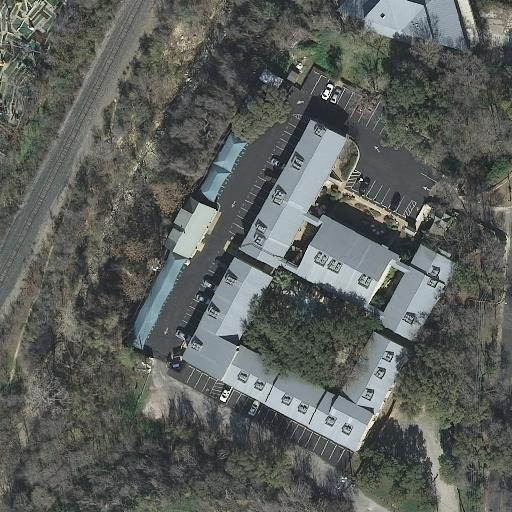

segmentation_mask :


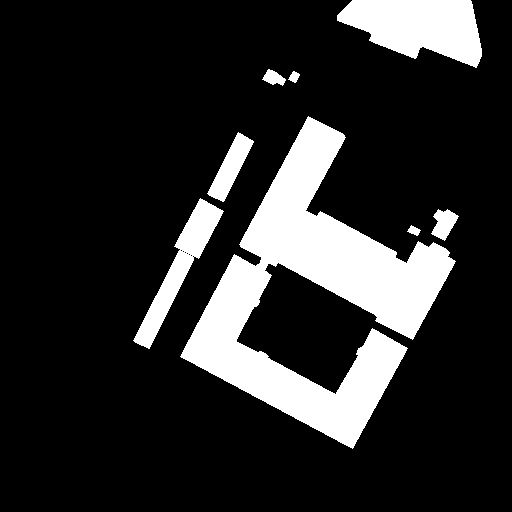

Segmentation calculée :


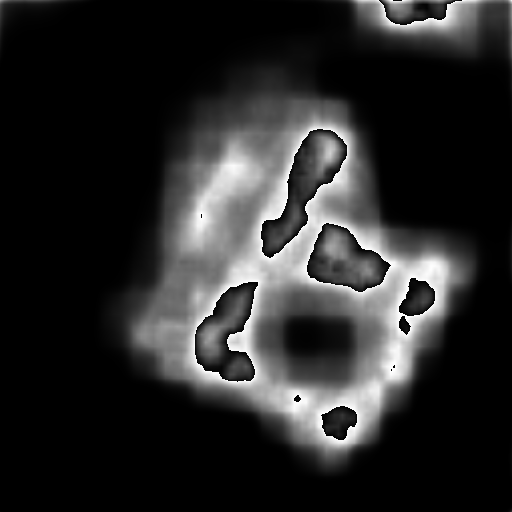

Epoch [1/2], Loss: 0.0052


Epoch 2/2: 100%|██████████| 10/10 [01:05<00:00,  6.54s/it]

Image de base :


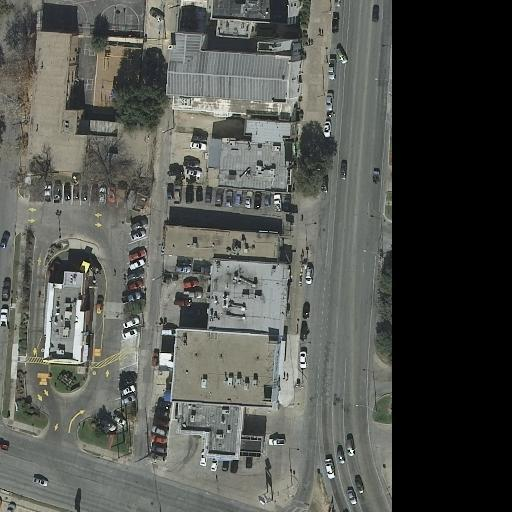

segmentation_mask :


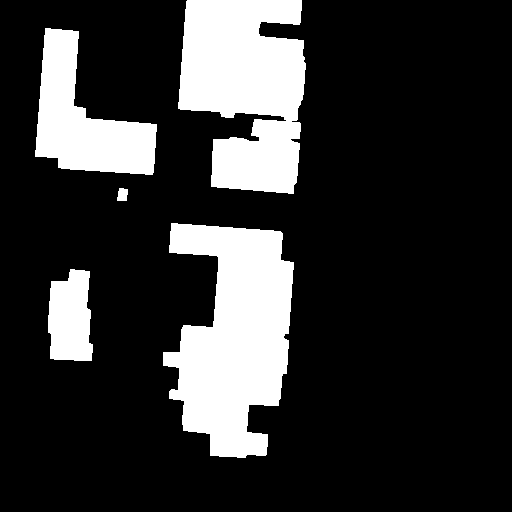

Segmentation calculée :


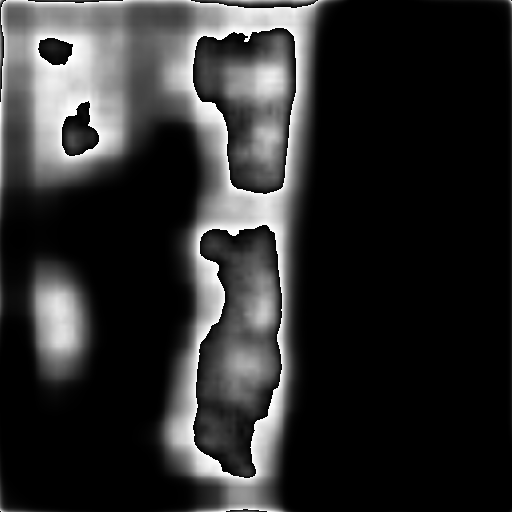

Epoch [2/2], Loss: 0.0053


In [16]:
from IPython.display import display

# training loop
train_loader = torch.utils.data.DataLoader(train_df, batch_size=10, shuffle=True)


epochs = 2
for epoch in range(epochs):   
    model.train()
    acc_for_avergage_loss = 0.0
    for batch in tqdm.tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs}"):
        input = batch["image"]
        target = batch["segmentation"]
        optimizer.zero_grad()
        outputs = model(input)
        loss = criterion(outputs, target)
        loss.backward()
        optimizer.step()
    
        acc_for_avergage_loss += loss.item()

    # Print the loss at the end of each epoch
    average_loss = acc_for_avergage_loss / len(train_loader)
    print("Image de base :")
    display(torchvision.transforms.ToPILImage()(input[0]).convert('RGB'))
    print("segmentation_mask :")
    display(torchvision.transforms.ToPILImage()(target[0]*255).convert('RGB'))
    # print_images(input)
    print("Segmentation calculée :")
    display(torchvision.transforms.ToPILImage()(outputs[0]*255).convert('RGB'))
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch + 1, epochs, average_loss))

#####################################
Image de base :


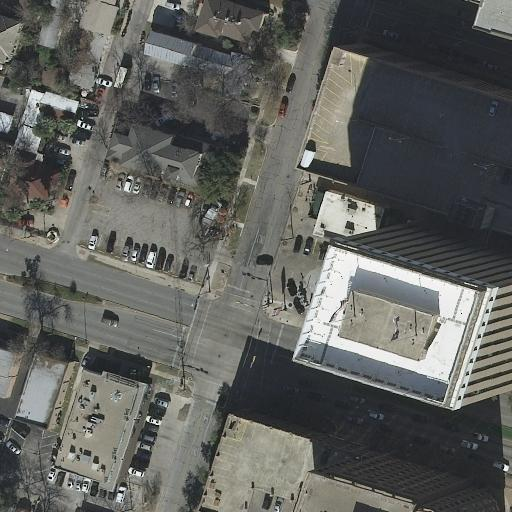

segmentation_mask :


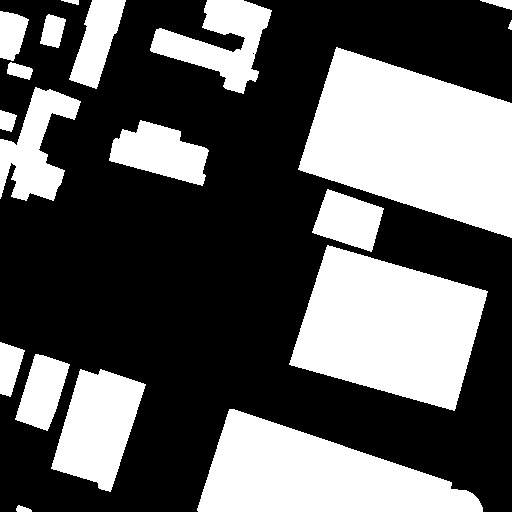

Segmentation calculée :


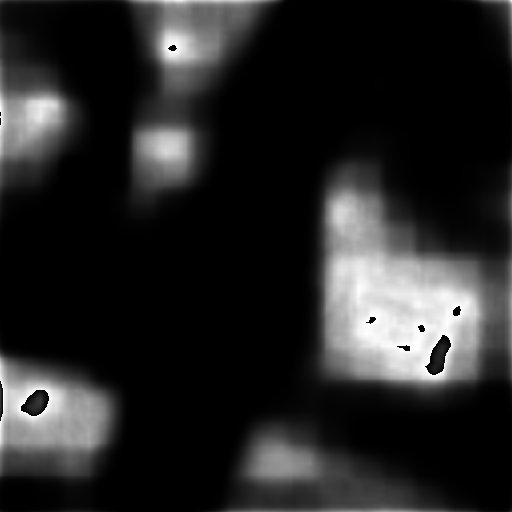

#####################################
Image de base :


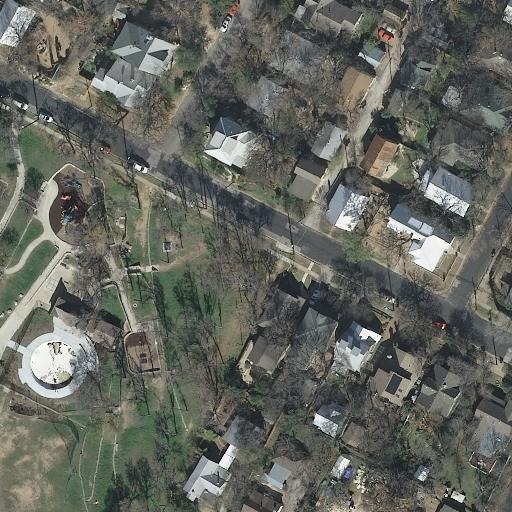

segmentation_mask :


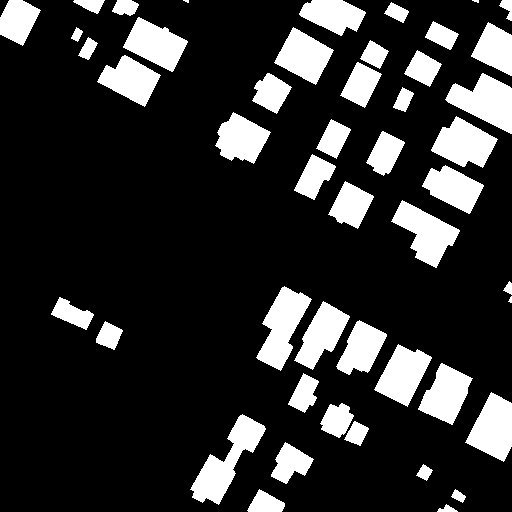

Segmentation calculée :


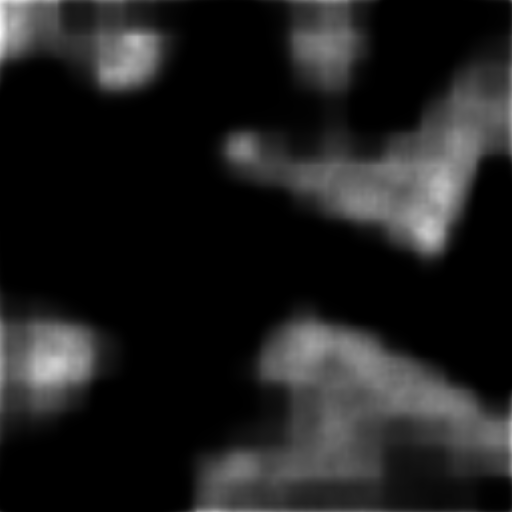

#####################################
Image de base :


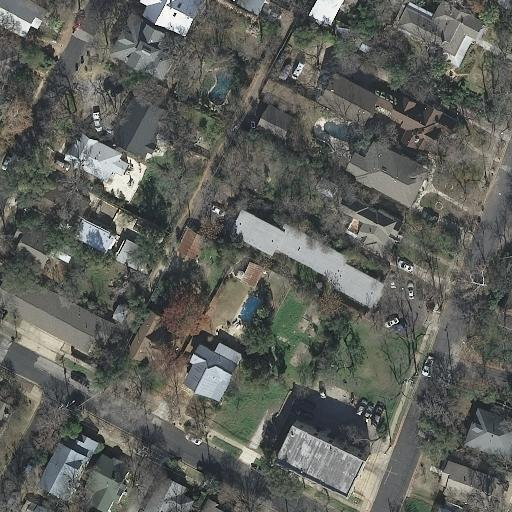

segmentation_mask :


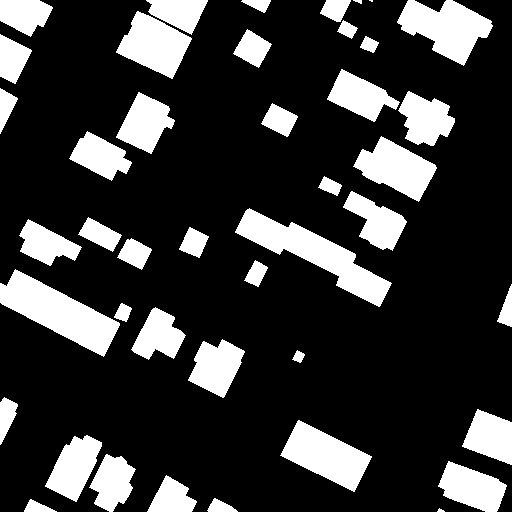

Segmentation calculée :


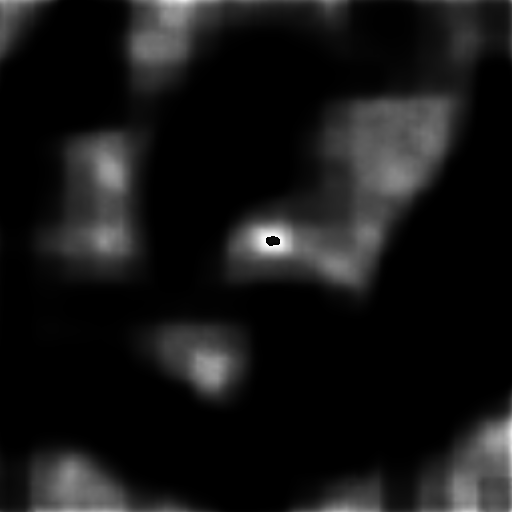

#####################################
Image de base :


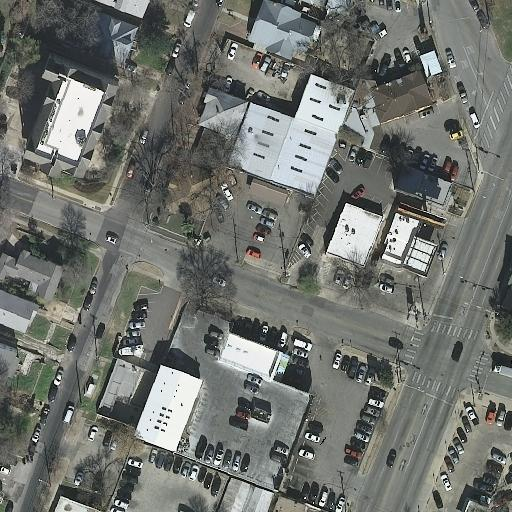

segmentation_mask :


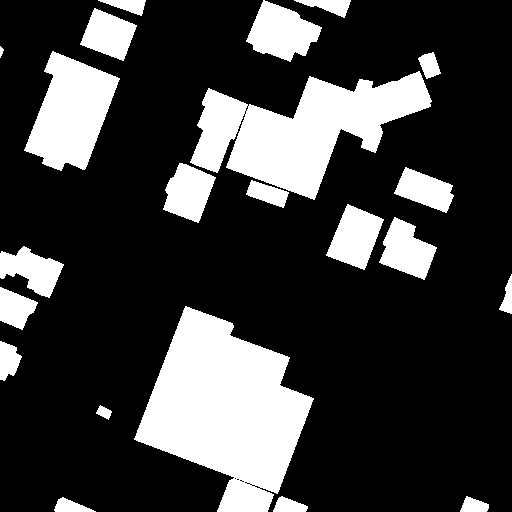

Segmentation calculée :


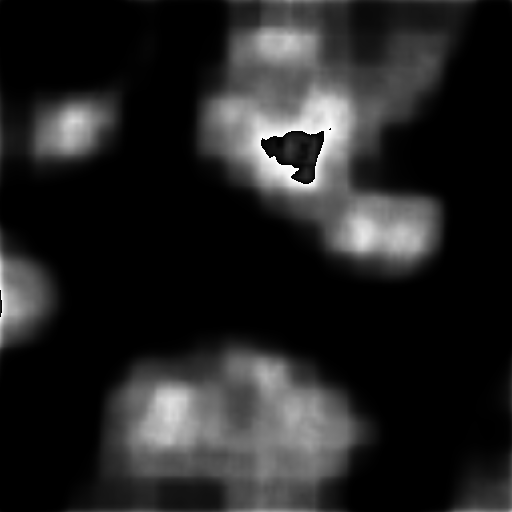

#####################################
Image de base :


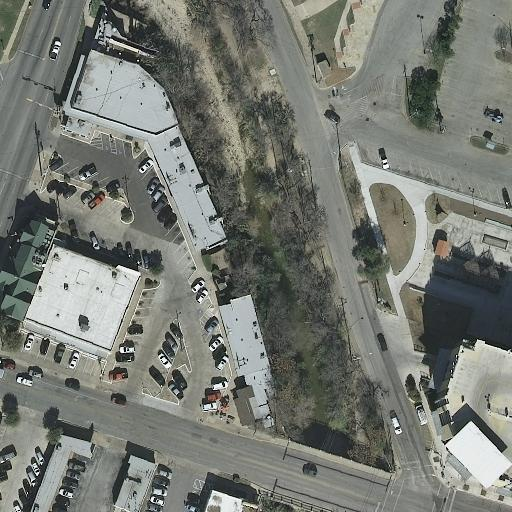

segmentation_mask :


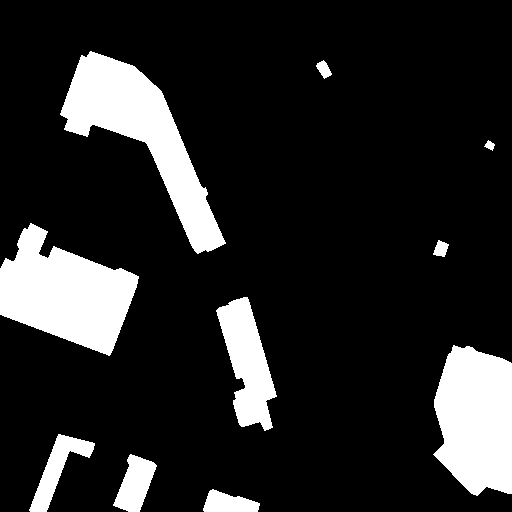

Segmentation calculée :


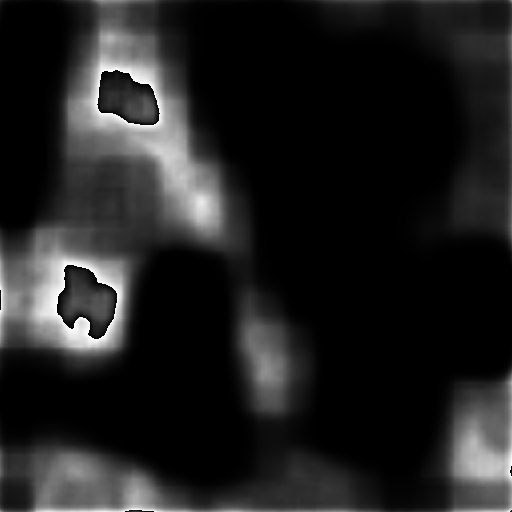

#####################################
Image de base :


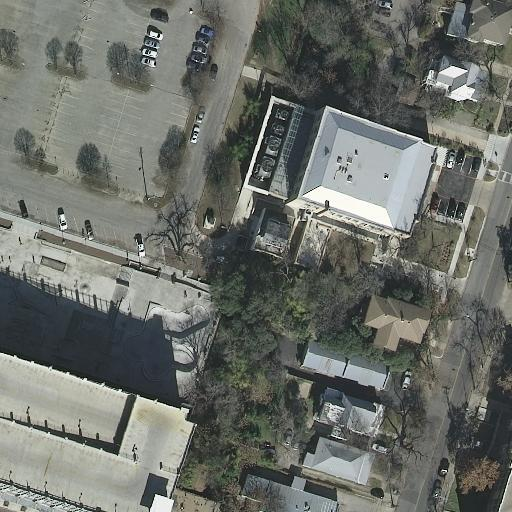

segmentation_mask :


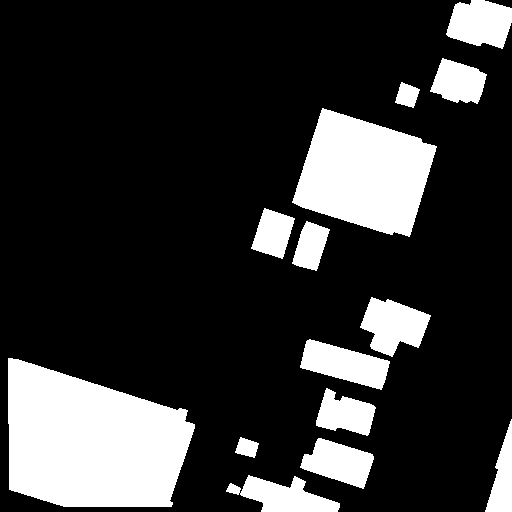

Segmentation calculée :


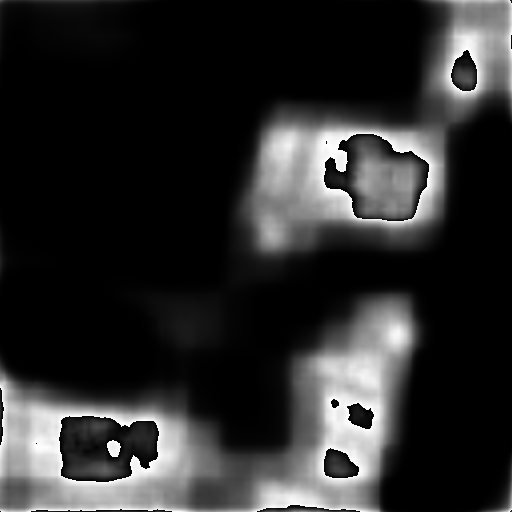

#####################################
Image de base :


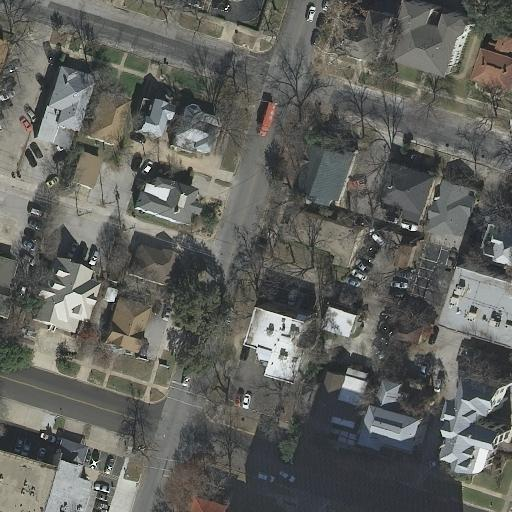

segmentation_mask :


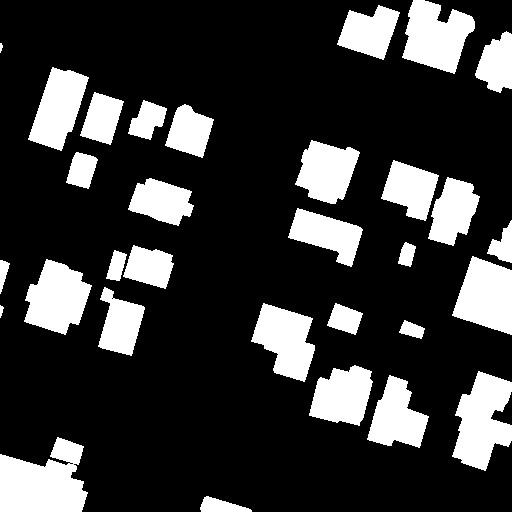

Segmentation calculée :


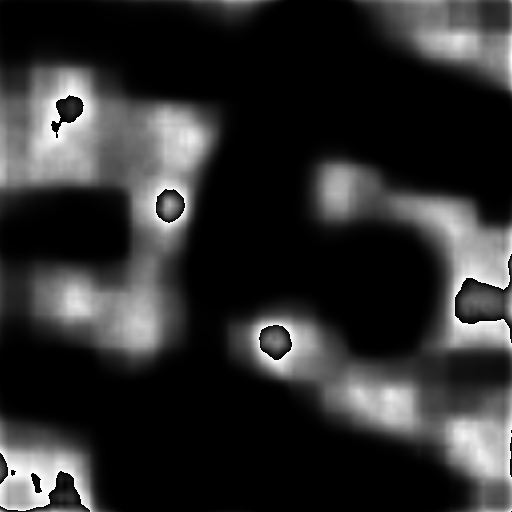

#####################################
Image de base :


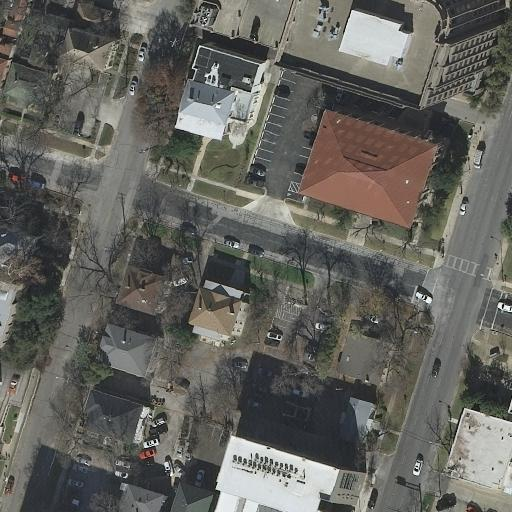

segmentation_mask :


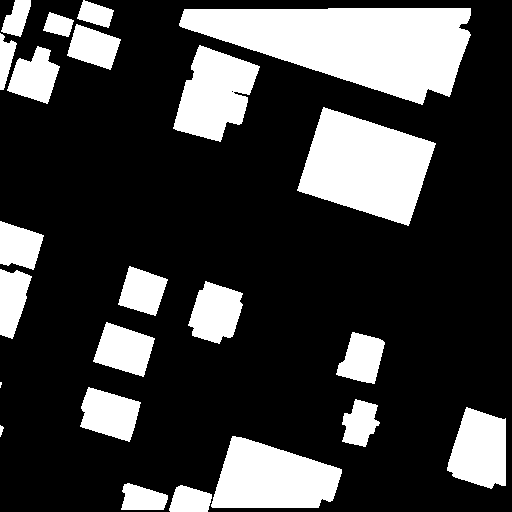

Segmentation calculée :


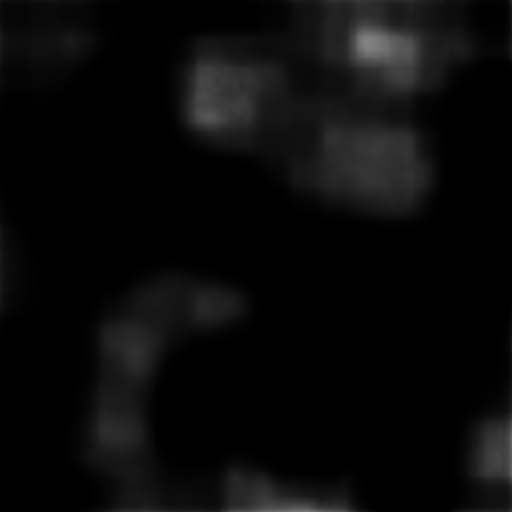

#####################################
Image de base :


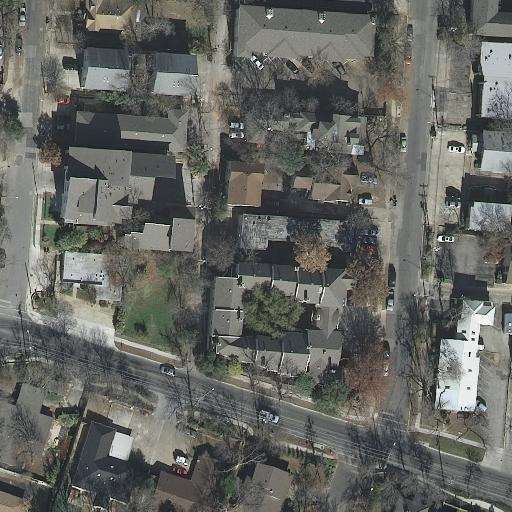

segmentation_mask :


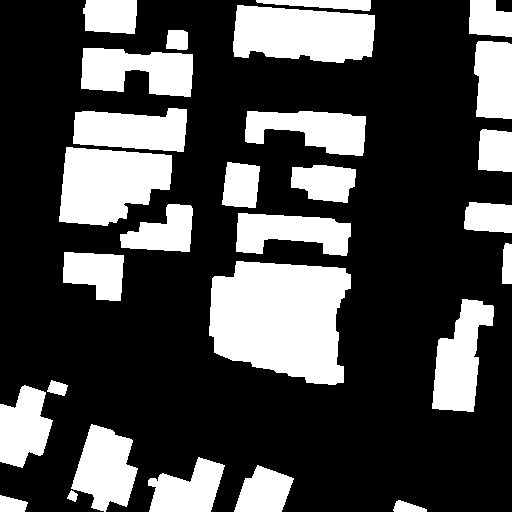

Segmentation calculée :


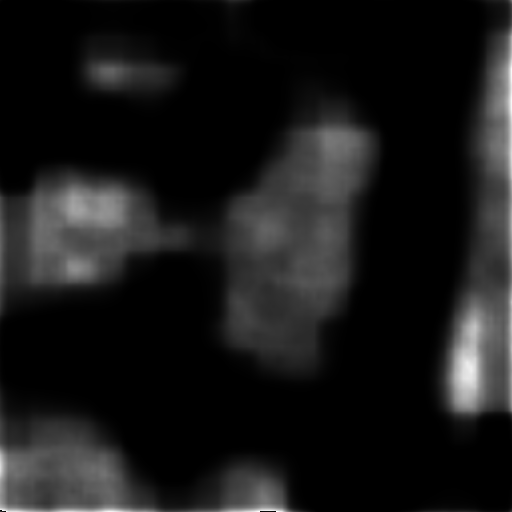

#####################################
Image de base :


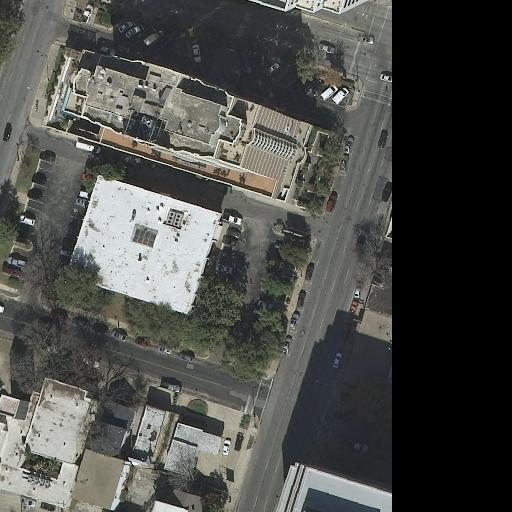

segmentation_mask :


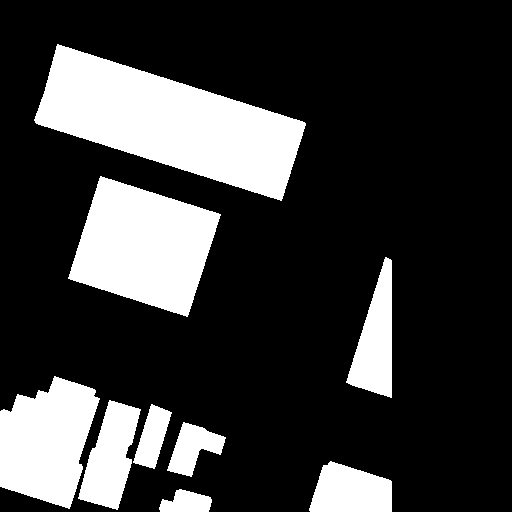

Segmentation calculée :


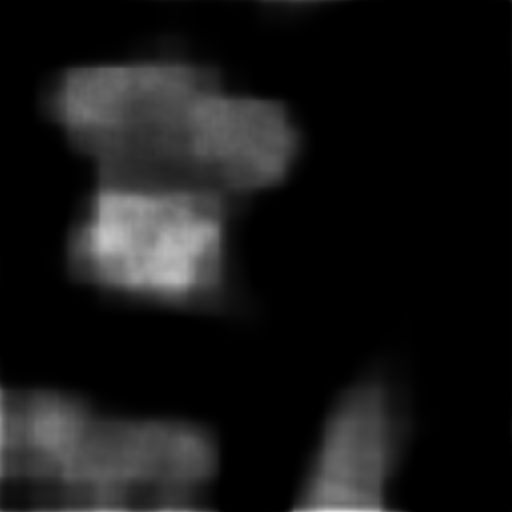

#####################################
Image de base :


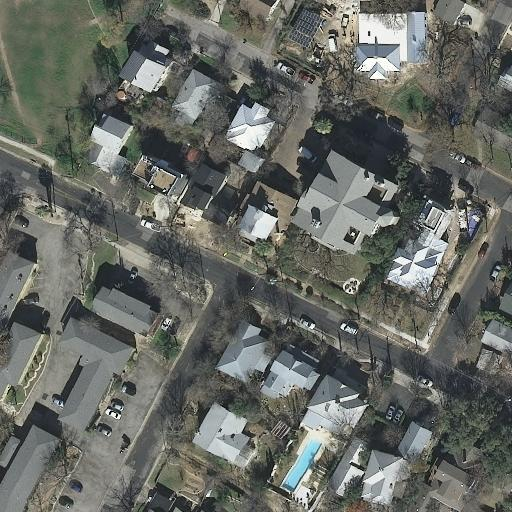

segmentation_mask :


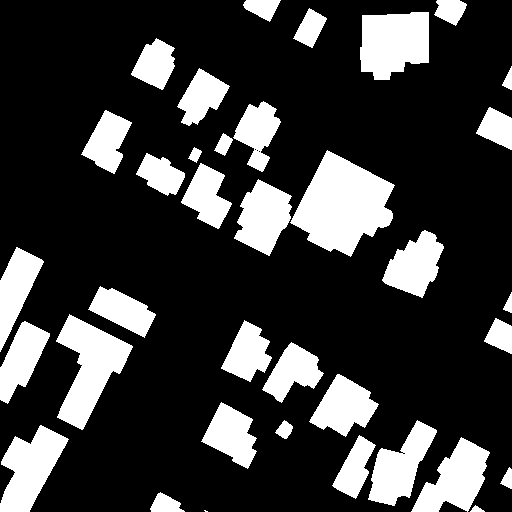

Segmentation calculée :


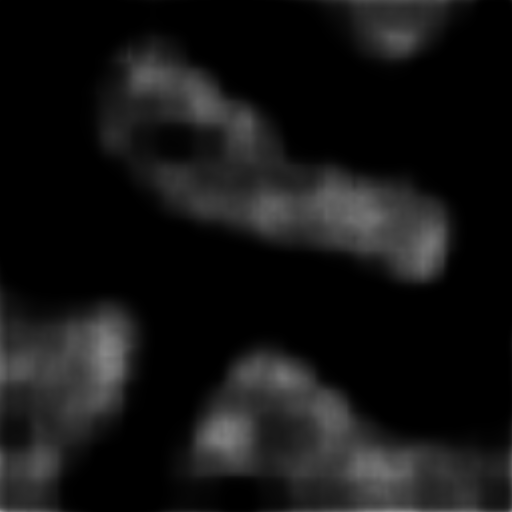

#####################################
Image de base :


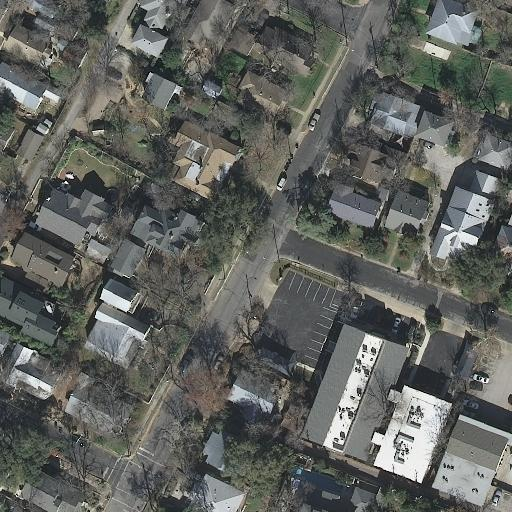

segmentation_mask :


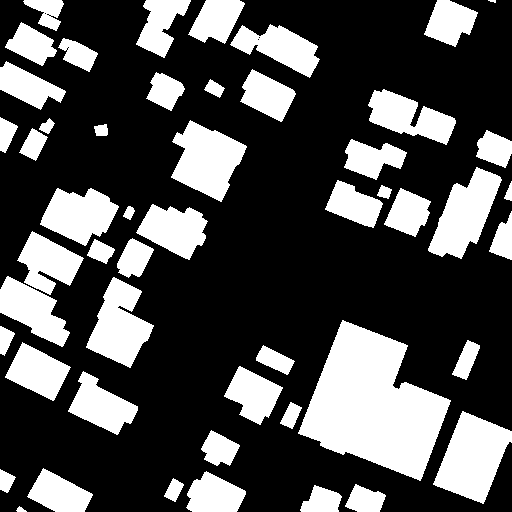

Segmentation calculée :


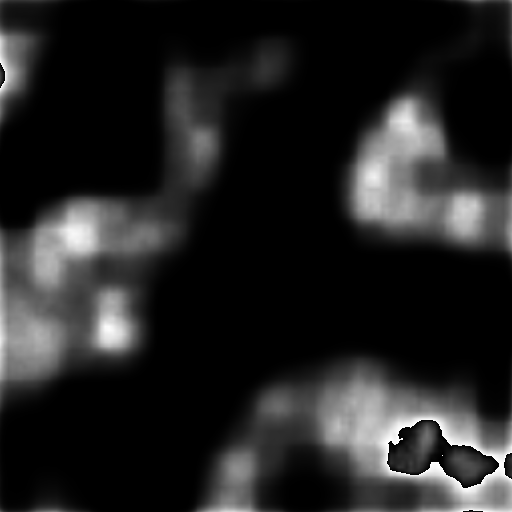

#####################################
Image de base :


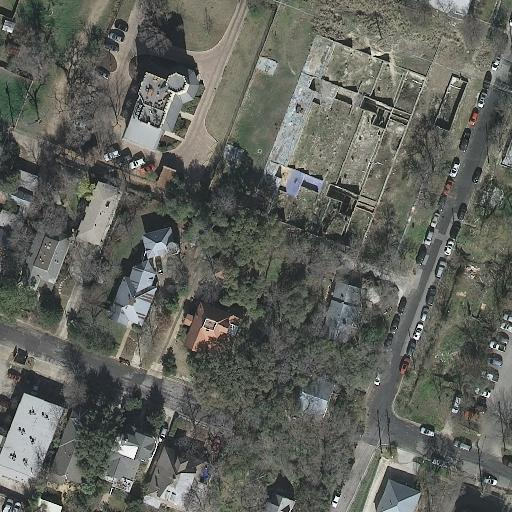

segmentation_mask :


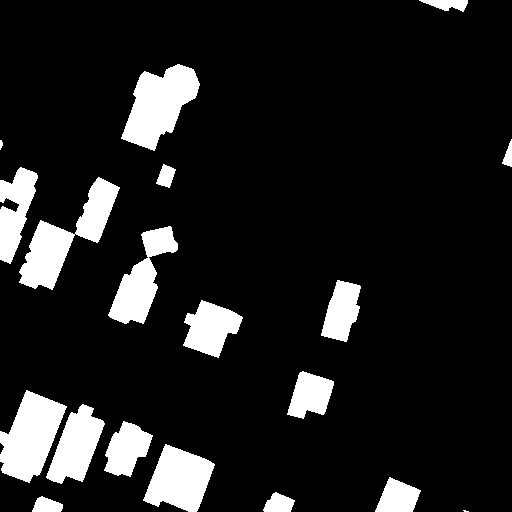

Segmentation calculée :


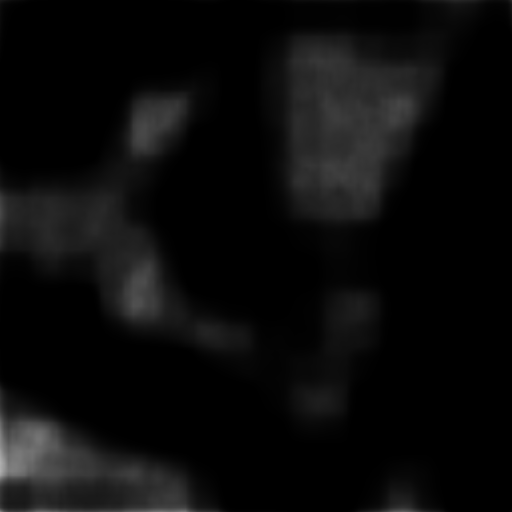

#####################################
Image de base :


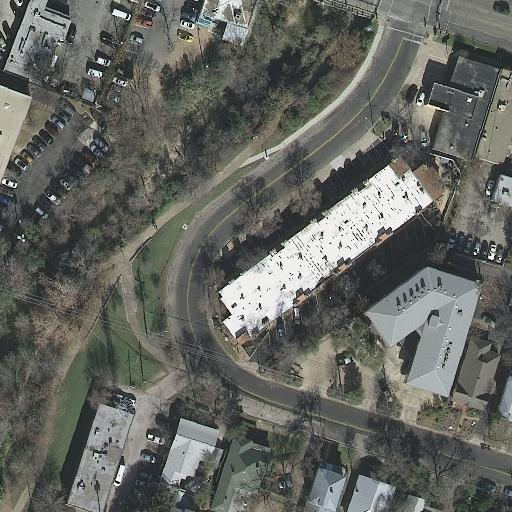

segmentation_mask :


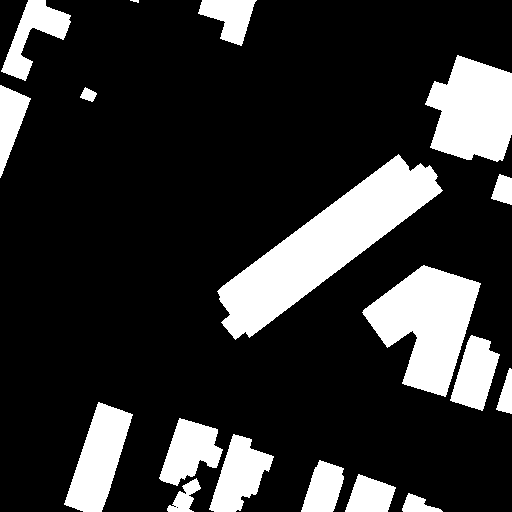

Segmentation calculée :


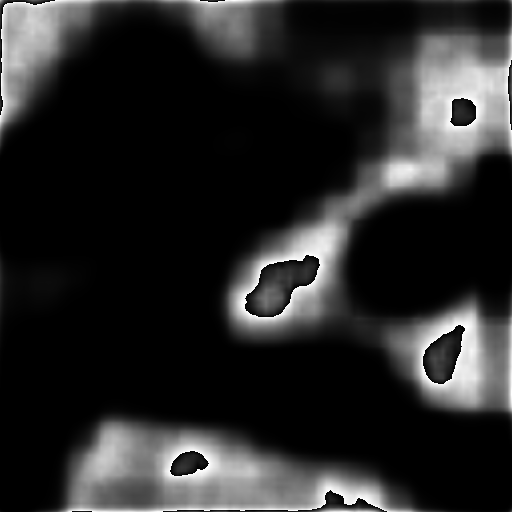

#####################################
Image de base :


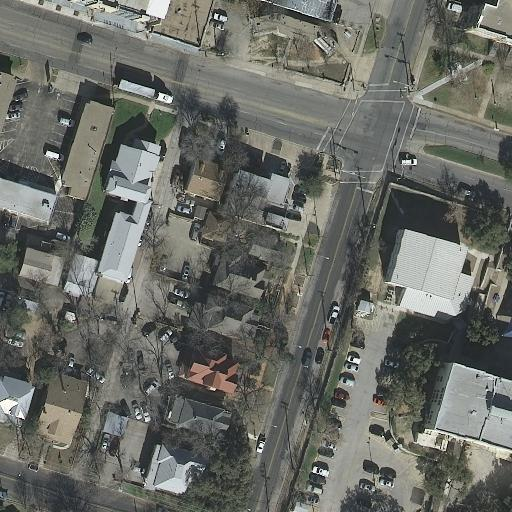

segmentation_mask :


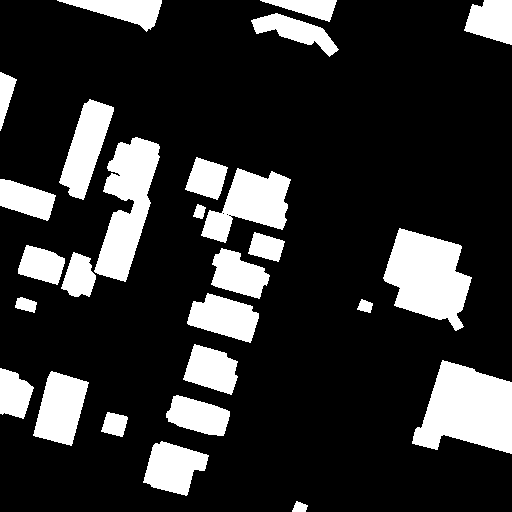

Segmentation calculée :


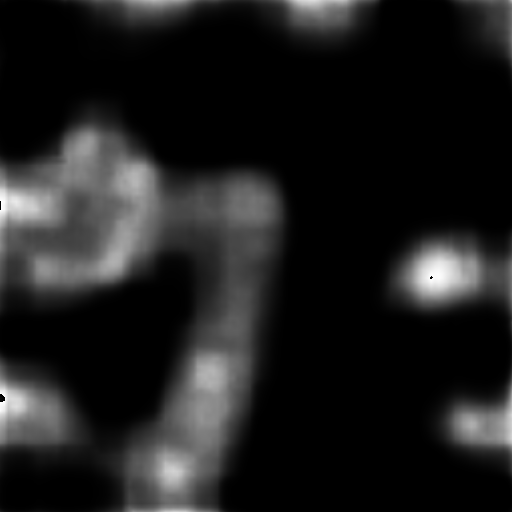

#####################################
Image de base :


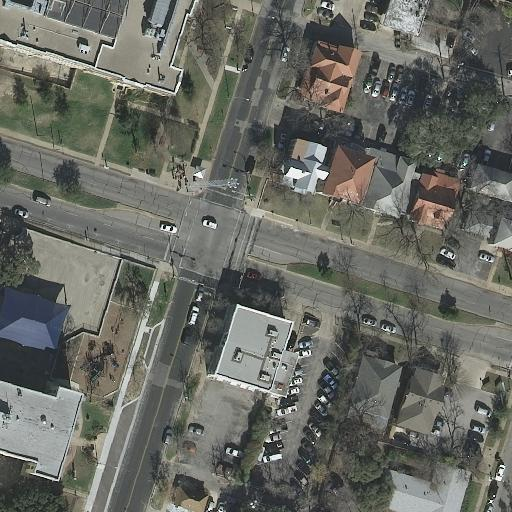

segmentation_mask :


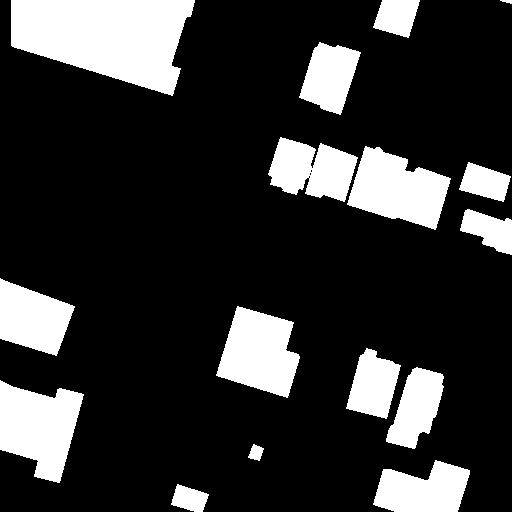

Segmentation calculée :


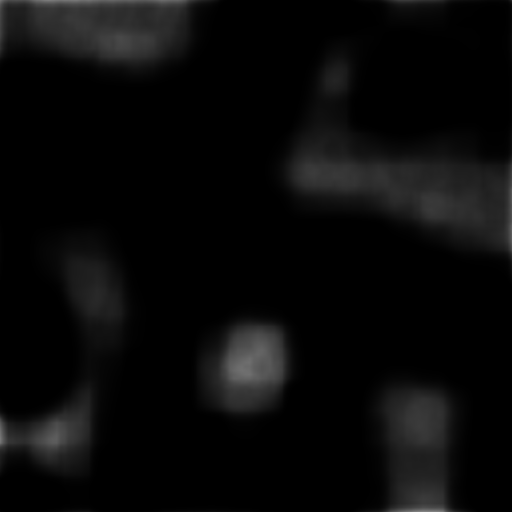

#####################################
Image de base :


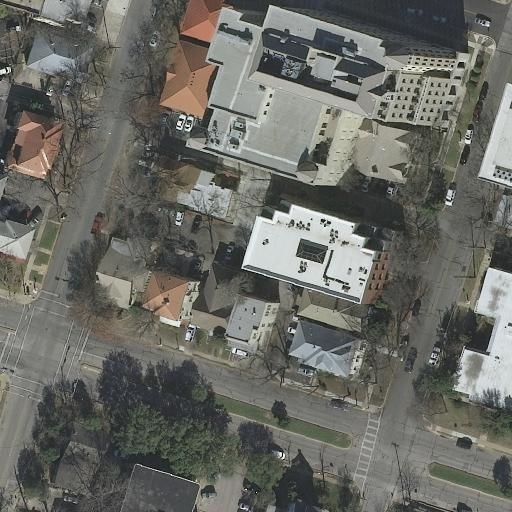

segmentation_mask :


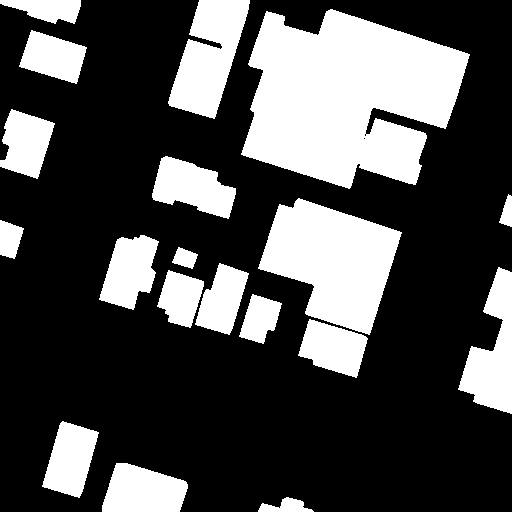

Segmentation calculée :


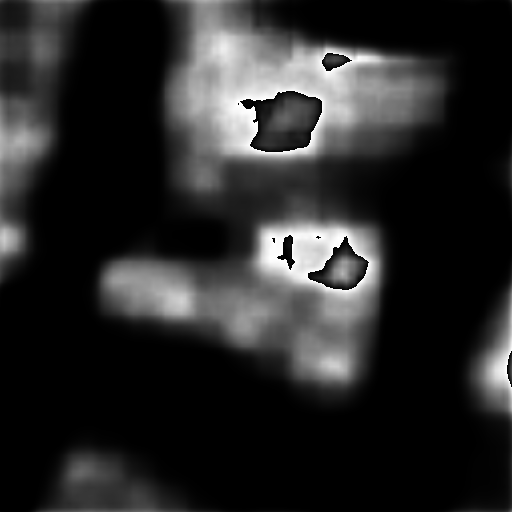

#####################################
Image de base :


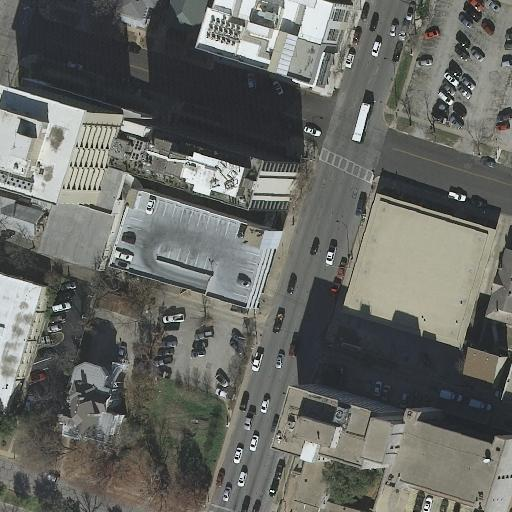

segmentation_mask :


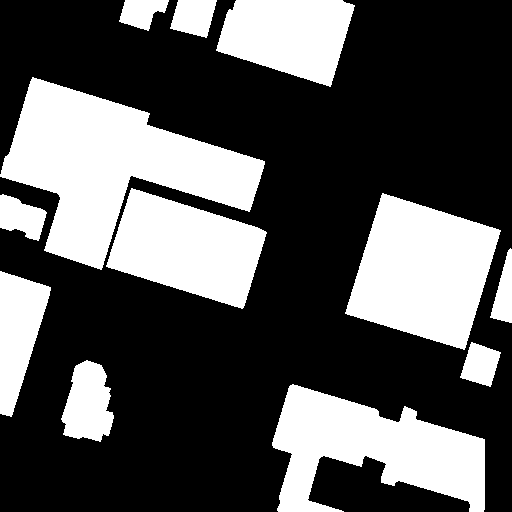

Segmentation calculée :


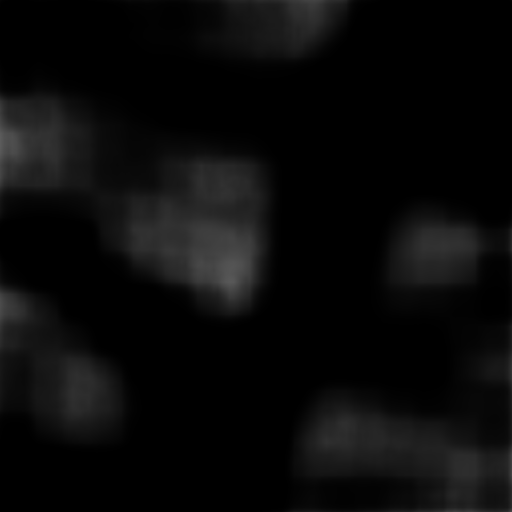

#####################################
Image de base :


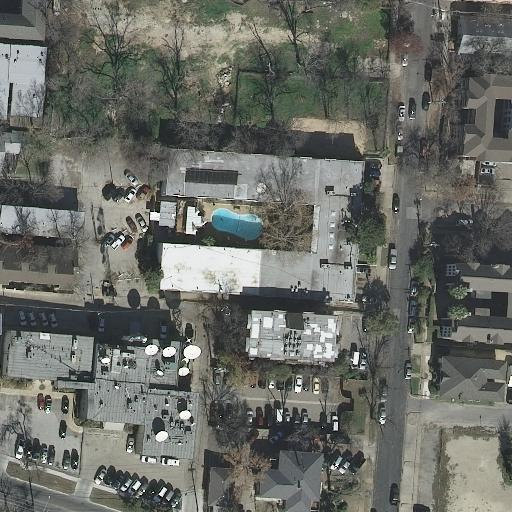

segmentation_mask :


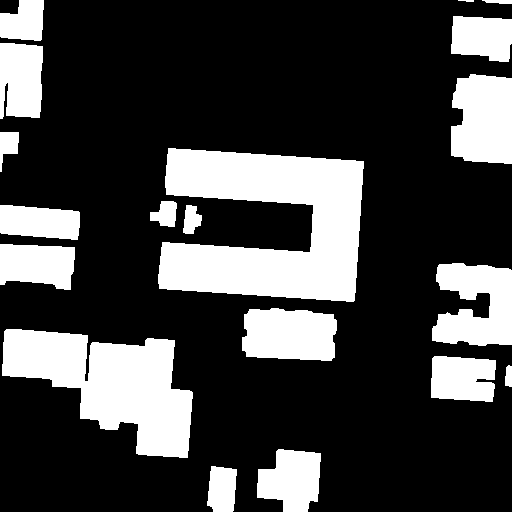

Segmentation calculée :


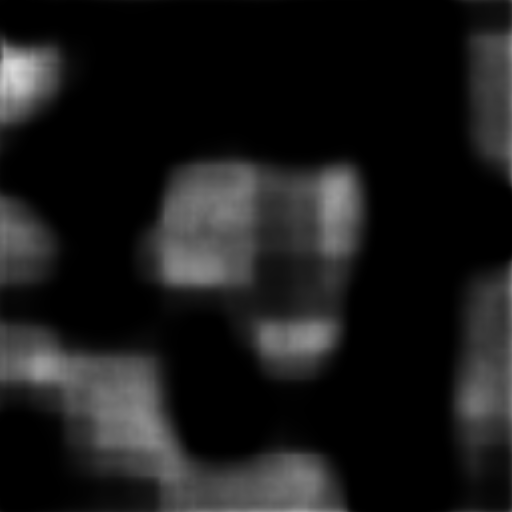

#####################################
Image de base :


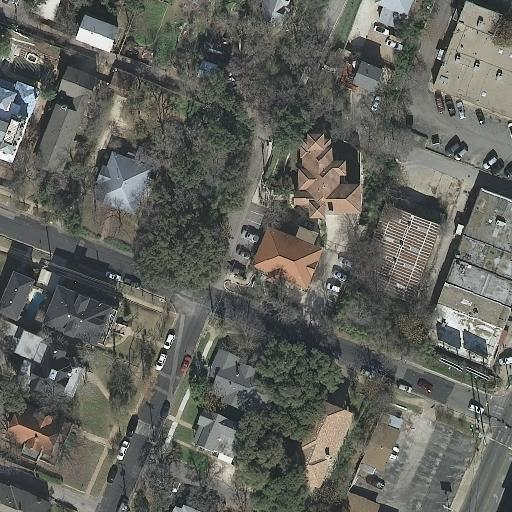

segmentation_mask :


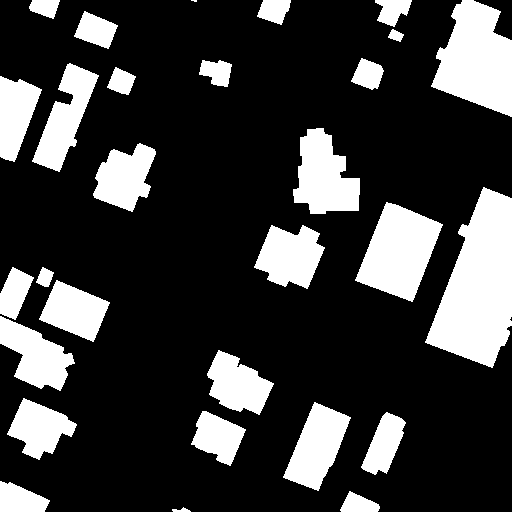

Segmentation calculée :


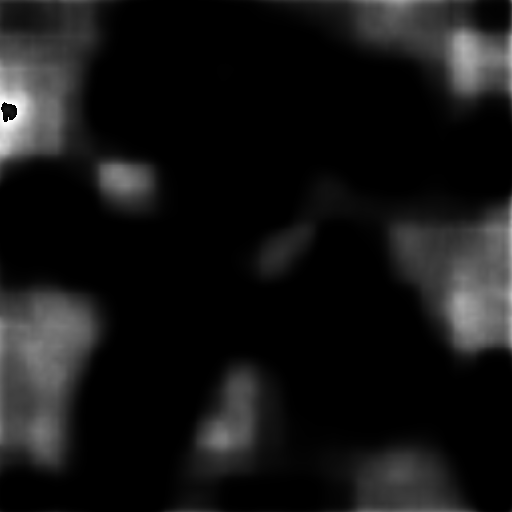

In [17]:
test_df = MyDataset(test_set, transform)

test_loader = torch.utils.data.DataLoader(test_df, batch_size=1)

print(test_loader)

for im in test_loader:
    print("#####################################")
    input = im['image']
    target = im["segmentation"]
    outputs = model(input)
    

    print("Image de base :")
    display(torchvision.transforms.ToPILImage()(input[0]).convert('RGB'))
    print("segmentation_mask :")
    display(torchvision.transforms.ToPILImage()(target[0]*255).convert('RGB'))
    # print_images(input)
    print("Segmentation calculée :")
    display(torchvision.transforms.ToPILImage()(outputs[0]*255).convert('RGB'))